# 1. Entendimiento del problema - Understanding the problem

Una clínica de ginecobstetricia cuenta con información de 2.126 registros de cardiotocografía fetal (histogramas) obtenidos durante el monitoreo del ritmo cardíaco del feto. A partir de estos registros se analizan diferentes variables fisiológicas relacionadas con la actividad cardíaca fetal, los movimientos del feto y las contracciones uterinas.

El objetivo para la clínica es identificar de forma temprana si el estado de salud del feto es normal, sospechoso o patológico, con el fin de apoyar el diagnóstico médico y facilitar decisiones clínicas oportunas durante el control prenatal o el trabajo de parto.

Contar con un modelo predictivo que clasifique correctamente el estado de salud fetal permitiría mejorar la detección temprana de posibles patologías cardiacas, optimizar la atención médica y reducir riesgos para el feto.


# 2. Enfoque analítico - Analitical Scope


Desarrollar un modelo de clasificación multiclase que permita predecir el estado de salud fetal (Normal, Sospechoso o Patológico) a partir de variables extraídas de los registros de cardiotocografía.

El modelo debe alcanzar un desempeño superior al 85% en accuracy, buscando además optimizar métricas como F1-score y matriz de confusión para evaluar la calidad de la clasificación en cada una de las clases.


# 3. Requerimiento de datos - Data requirements

- Información sobre la frecuencia cardiaca fetal
- Información sobre movimientos fetales
- Información sobre contracciones uterinas
- Información sobre variabilidad del ritmo cardiaco
- Información estadística proveniente de histogramas del electrocardiograma fetal
- Clasificación del estado de salud fetal

# 4. Recolección de datos - data collection

El conjunto de datos incluye variables derivadas del monitoreo cardiotocográfico del feto:

Datos fisiológicos del ritmo cardiaco
- baseline: tasa cardiaca base fetal
- accelerations: número de aceleraciones por segundo
- fetal_movement: movimientos fetales por segundo

Datos de actividad uterina
- uterine_contractions: número de contracciones uterinas por segundo

Datos de desaceleraciones cardiacas
- light_decelerations: desaceleraciones leves
- severe_decelerations: desaceleraciones fuertes
- prolongued_decelerations: desaceleraciones prolongadas

Datos de variabilidad del ritmo cardiaco
- abnormal_short_term_variability: porcentaje de tiempo con variabilidad anormal de corto plazo
- mean_value_of_short_term_variability: promedio de variabilidad de corto plazo
- percentage_of_time_with_abnormal_long_term_variability: porcentaje de tiempo con variabilidad anormal de largo plazo
- mean_value_of_long_term_variability: promedio de variabilidad de largo plazo

Datos derivados del histograma del electrocardiograma
- histogram_width
- histogram_min
- histogram_max
- histogram_number_of_peaks
- histogram_number_of_zeroes
- histogram_mode
- histogram_mean
- histogram_median
- histogram_variance
- histogram_tendency

Variable objetivo
- fetal_health: estado de salud fetal  
  - 1: Normal  
  - 2: Sospechoso  
  - 3: Patológico

In [4]:
import pandas as  pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [5]:
data = pd.read_csv('datos_caso2.csv')
data.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


# 5. Entendimiento de los datos - Data understanding

- Nulidad de la fuente de datos
- Validar sesgos de las variables numéricas
- Validas desbalance de las categóricas
- Validar multicolinealidad

In [6]:
import matplotlib.pyplot as plt
import seaborn as sb

In [7]:
#Datos nulos
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   float64
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   float64
 8   mean_value_of_short_term_variability  

In [8]:
#Estadísticas descriptivas
##Variables numéricas
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
baseline value,2126.0,133.303857,9.840844,106.0,126.000,133.000,140.000,160.000
accelerations,2126.0,0.003178,0.003866,0.0,0.000,0.002,0.006,0.019
fetal_movement,2126.0,0.009481,0.046666,0.0,0.000,0.000,0.003,0.481
uterine_contractions,2126.0,0.004366,0.002946,0.0,0.002,0.004,0.007,0.015
light_decelerations,2126.0,0.001889,0.002960,0.0,0.000,0.000,0.003,0.015
severe_decelerations,2126.0,0.000003,0.000057,0.0,0.000,0.000,0.000,0.001
prolongued_decelerations,2126.0,0.000159,0.000590,0.0,0.000,0.000,0.000,0.005
abnormal_short_term_variability,2126.0,46.990122,17.192814,12.0,32.000,49.000,61.000,87.000
mean_value_of_short_term_variability,2126.0,1.332785,0.883241,0.2,0.700,1.200,1.700,7.000
percentage_of_time_with_abnormal_long_term_variability,2126.0,9.846660,18.396880,0.0,0.000,0.000,11.000,91.000


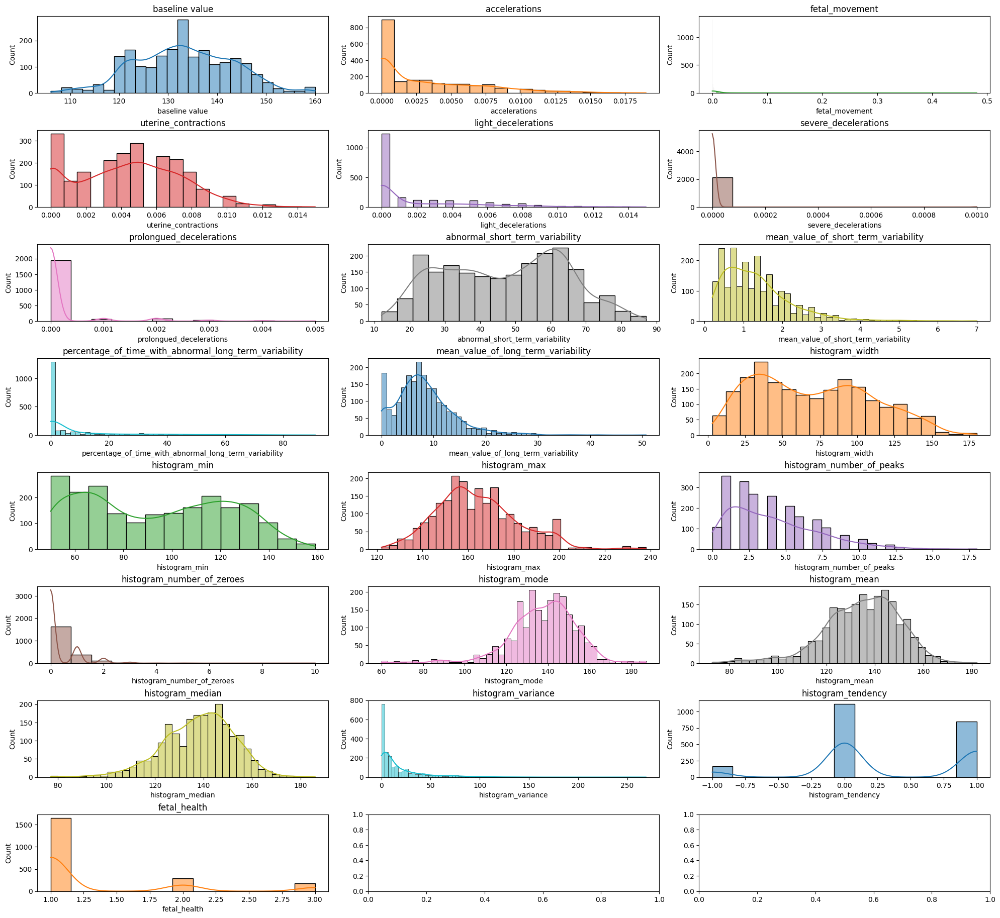

In [9]:
#Histogramas de frecuencia
fig, ax = plt.subplots(8, 3, figsize=(20, 20))
ax = ax.flat
num_col = data.select_dtypes(include= ['int64','float64']).columns.to_list()
for i, col in enumerate(num_col):
    sb.histplot(data = data,
                x = col, kde = True, color = (list(plt.rcParams['axes.prop_cycle'])*7)[i]['color'],
                ax=ax[i])
    ax[i].set_title(col)
    
fig.tight_layout()
fig.subplots_adjust(top=0.9)
plt.show()

In [10]:
variables = ['prolongued_decelerations', 
             'histogram_number_of_zeroes', 'severe_decelerations']

for col in variables:
    print(f"{col}: {sorted(data[col].unique())}")

prolongued_decelerations: [np.float64(0.0), np.float64(0.001), np.float64(0.002), np.float64(0.003), np.float64(0.004), np.float64(0.005)]
histogram_number_of_zeroes: [np.float64(0.0), np.float64(1.0), np.float64(2.0), np.float64(3.0), np.float64(4.0), np.float64(5.0), np.float64(7.0), np.float64(8.0), np.float64(10.0)]
severe_decelerations: [np.float64(0.0), np.float64(0.001)]


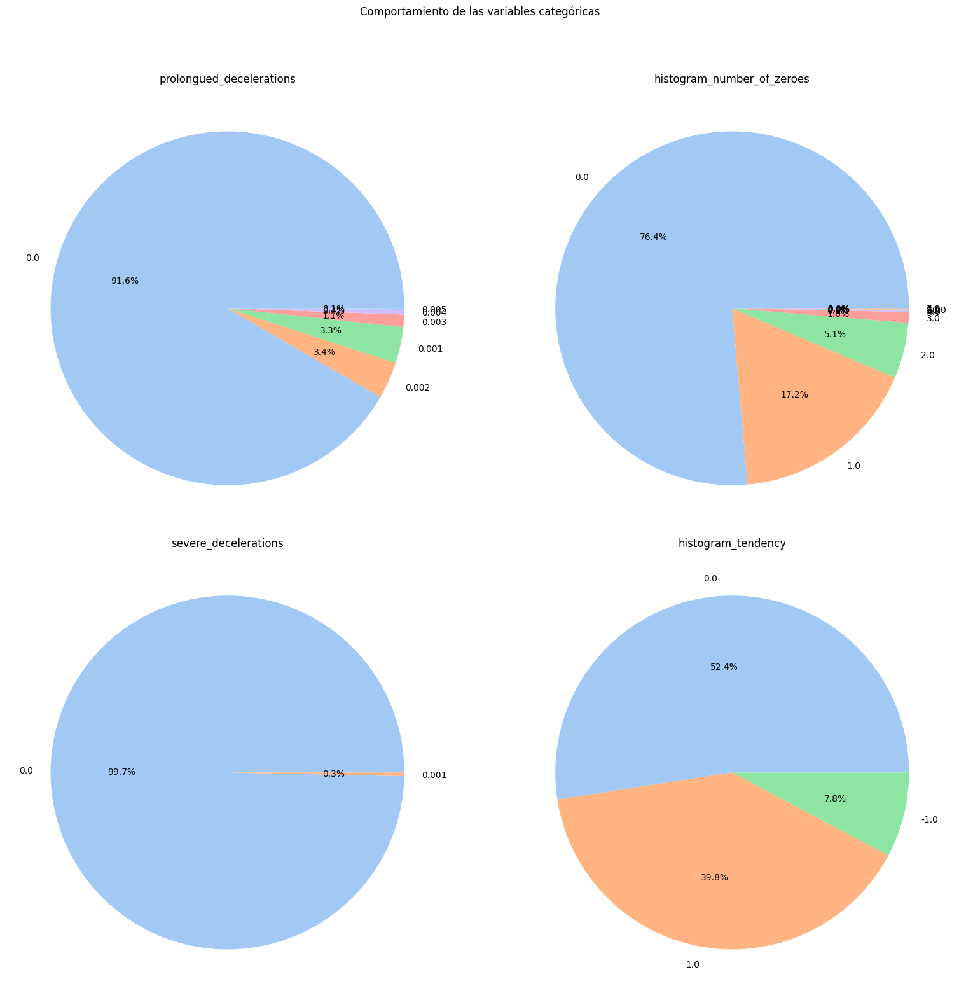

In [11]:
# Pasar variables de encuesta a categóricas
num_cat_col= ['prolongued_decelerations', 
             'histogram_number_of_zeroes', 'severe_decelerations', 'histogram_tendency']
fig,ax=plt.subplots(2,2,figsize=(16,16))
ax = ax.flat
for i,col in enumerate(num_cat_col):
    ax[i].pie(x=data[col].value_counts(), labels=data[col].value_counts().index, autopct='%1.1f%%', colors=sb.color_palette('pastel')[0:5])
    ax[i].set_title(col)
fig.tight_layout()
fig.subplots_adjust(top = 0.9)                                  
fig.suptitle('Comportamiento de las variables categóricas')
plt.show()

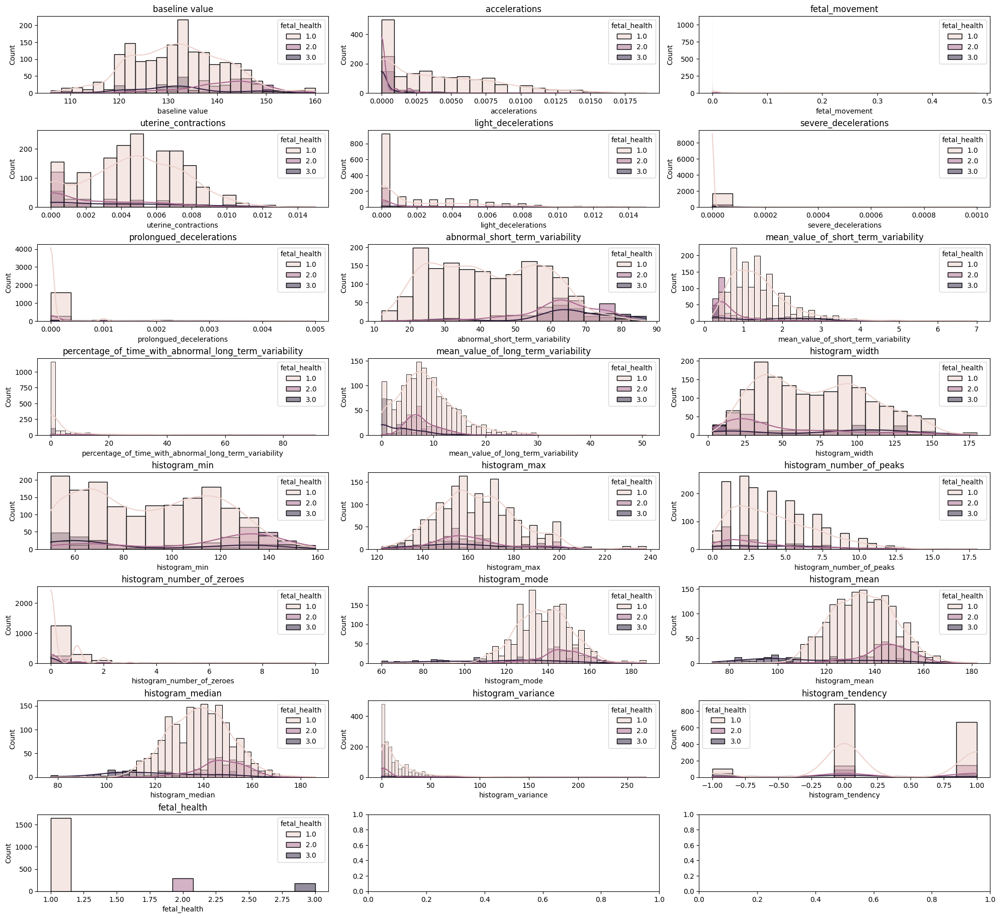

In [12]:
#Histogramas de frecuencia
fig, ax = plt.subplots(8, 3, figsize=(20, 20))
ax = ax.flat
num_col = data.select_dtypes(include= ['int64','float64']).columns.to_list()
for i, col in enumerate(num_col):
    sb.histplot(data = data,
                x = col, kde = True, hue = data.fetal_health,
                ax=ax[i])
    ax[i].set_title(col)
    
fig.tight_layout()
fig.subplots_adjust(top=0.9)
plt.show()

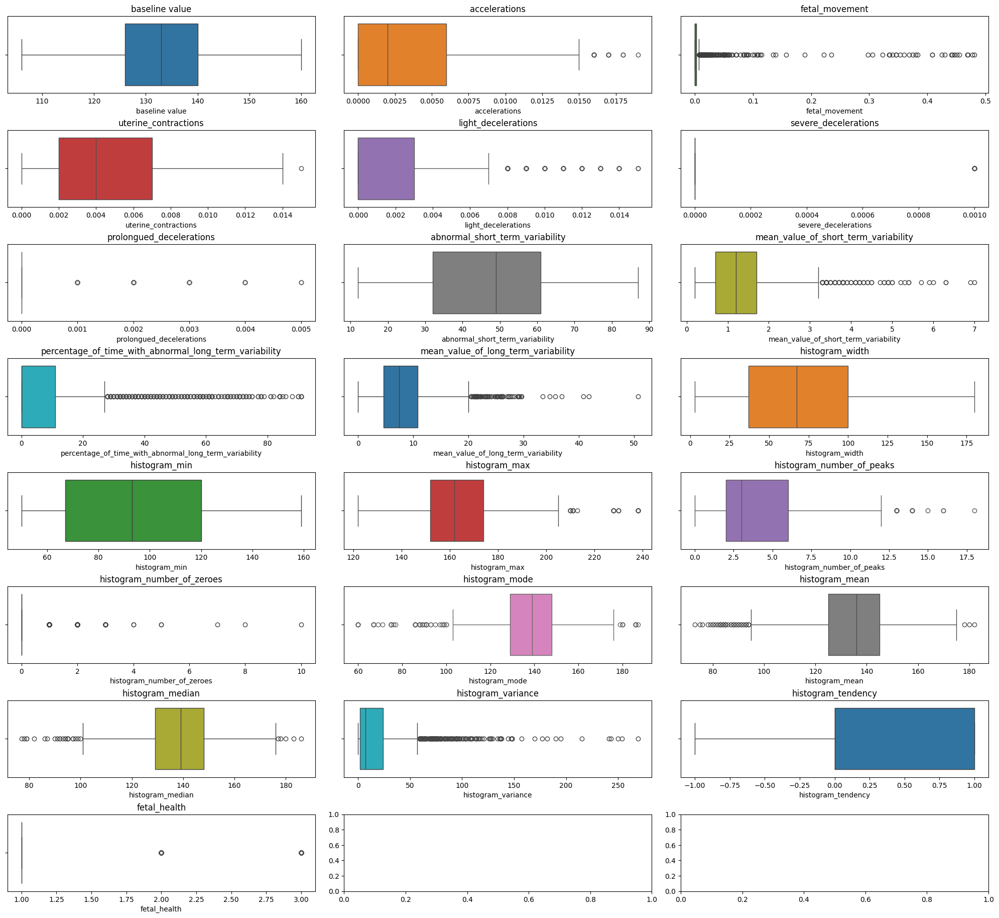

In [13]:
#Histogramas de frecuencia
fig, ax = plt.subplots(8, 3, figsize=(20, 20))
ax = ax.flat
num_col = data.select_dtypes(include= ['int64','float64']).columns.to_list()
for i, col in enumerate(num_col):
    sb.boxplot(data = data,
                x = col,  color = (list(plt.rcParams['axes.prop_cycle'])*7)[i]['color'],
                ax=ax[i])
    ax[i].set_title(col)
    
fig.tight_layout()
fig.subplots_adjust(top=0.9)
plt.show()

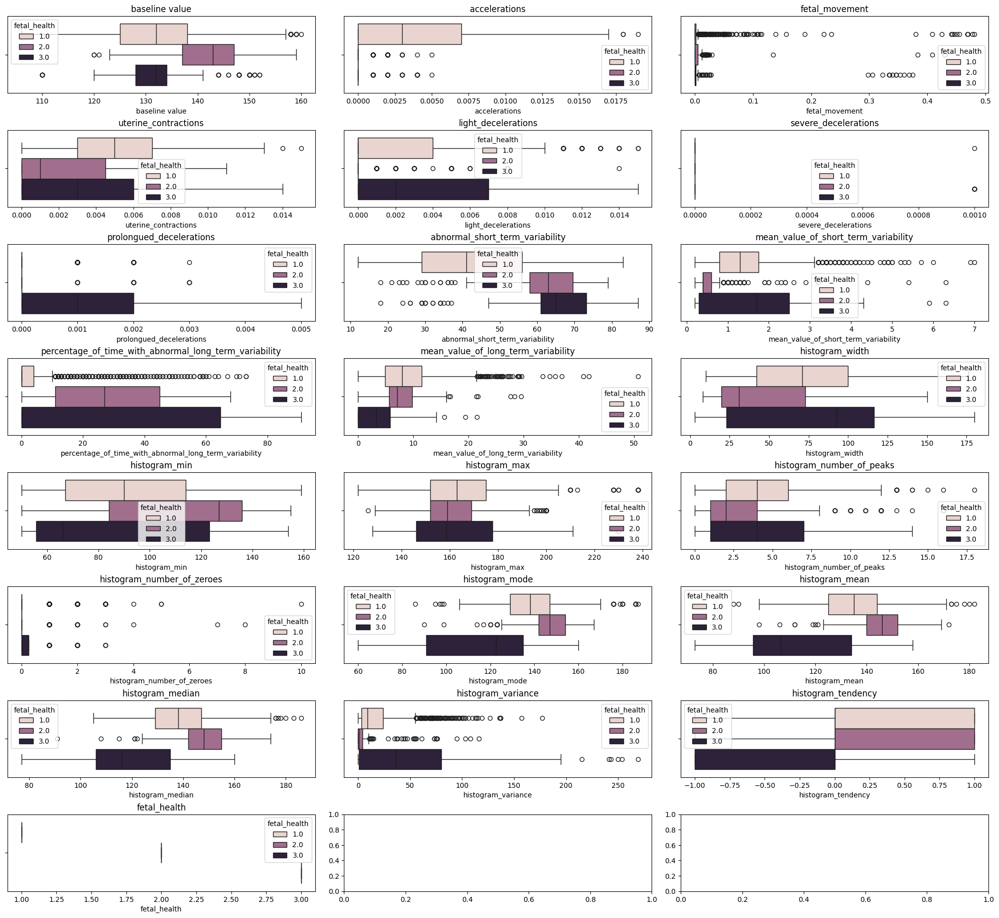

In [14]:
#Histogramas de frecuencia
fig, ax = plt.subplots(8, 3, figsize=(20, 20))
ax = ax.flat
num_col = data.select_dtypes(include= ['int64','float64']).columns.to_list()
for i, col in enumerate(num_col):
    sb.boxplot(data = data,
                x = col, hue = data.fetal_health,
                ax=ax[i])
    ax[i].set_title(col)
    
fig.tight_layout()
fig.subplots_adjust(top=0.9)
plt.show()

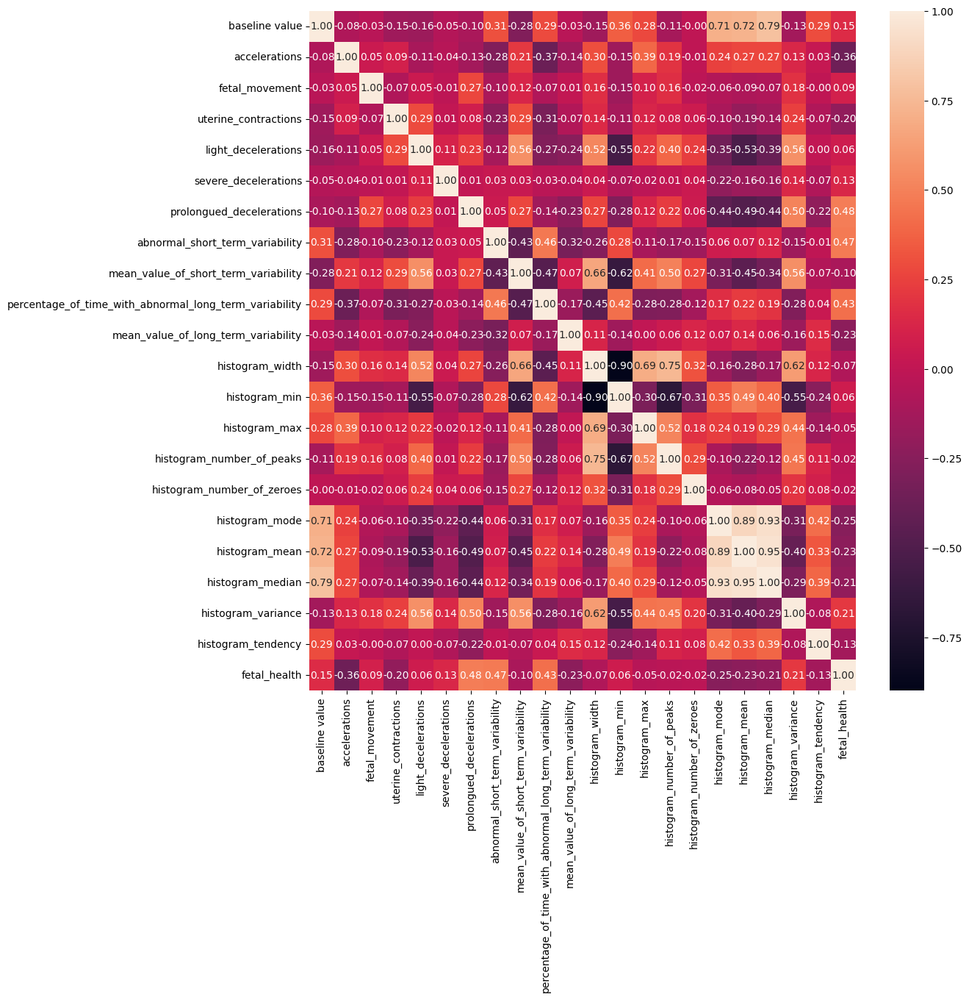

In [15]:
plt.figure(figsize=(12,12))
sb.heatmap(data=data.corr(numeric_only = True),annot=True,fmt='0.2f')
plt.show()


# 6. Preparación de los datos - Data preparation

- Ignorar las variables de baja representación o baja predictibilidad
- Balancear y.
- Escalar las numéricas y codificar las categóricas
- Construir los conjuntos de entrenamiento y validación

In [ ]:
data_mod = data.drop(columns = ['histogram_median', 'histogram_mean','histogram_width','prolongued_decelerations','severe_decelerations'])

In [17]:
#Balanceo por muestro incremental
data_mod_norm = data_mod[data_mod.fetal_health == 1]
data_mod_sus = data_mod[data_mod.fetal_health == 2]
data_mod_pat = data_mod[data_mod.fetal_health == 3]
print(f'Tamaño de datos Normal: {data_mod_norm.shape}')
print(f'Tamaño de datos Sospechosos: {data_mod_sus.shape}')
print(f'Tamaño de datos patológicos: {data_mod_pat.shape}')

Tamaño de datos Normal: (1655, 17)
Tamaño de datos Sospechosos: (295, 17)
Tamaño de datos patológicos: (176, 17)


In [18]:
np.random.seed(20)
data_mod_sus_re = data_mod_sus.sample(n = data_mod_norm.shape[0], replace = True)
data_mod_pat_re = data_mod_pat.sample(n = data_mod_norm.shape[0], replace = True)
data_mod_re = pd.concat([data_mod_norm, data_mod_sus_re, data_mod_pat_re])
data_mod_re = data_mod_re.reset_index(drop = True)
data_mod_re.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4965 entries, 0 to 4964
Data columns (total 17 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          4965 non-null   float64
 1   accelerations                                           4965 non-null   float64
 2   fetal_movement                                          4965 non-null   float64
 3   uterine_contractions                                    4965 non-null   float64
 4   light_decelerations                                     4965 non-null   float64
 5   abnormal_short_term_variability                         4965 non-null   float64
 6   mean_value_of_short_term_variability                    4965 non-null   float64
 7   percentage_of_time_with_abnormal_long_term_variability  4965 non-null   float64
 8   mean_value_of_long_term_variability   

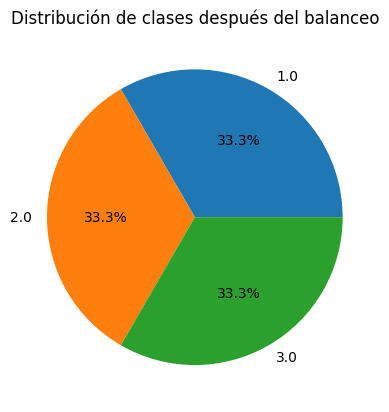

In [19]:
plt.pie(data_mod_re.fetal_health.value_counts(), labels = data_mod_re.fetal_health.value_counts().index, autopct = '%1.1f%%')
plt.title('Distribución de clases después del balanceo')
plt.show()

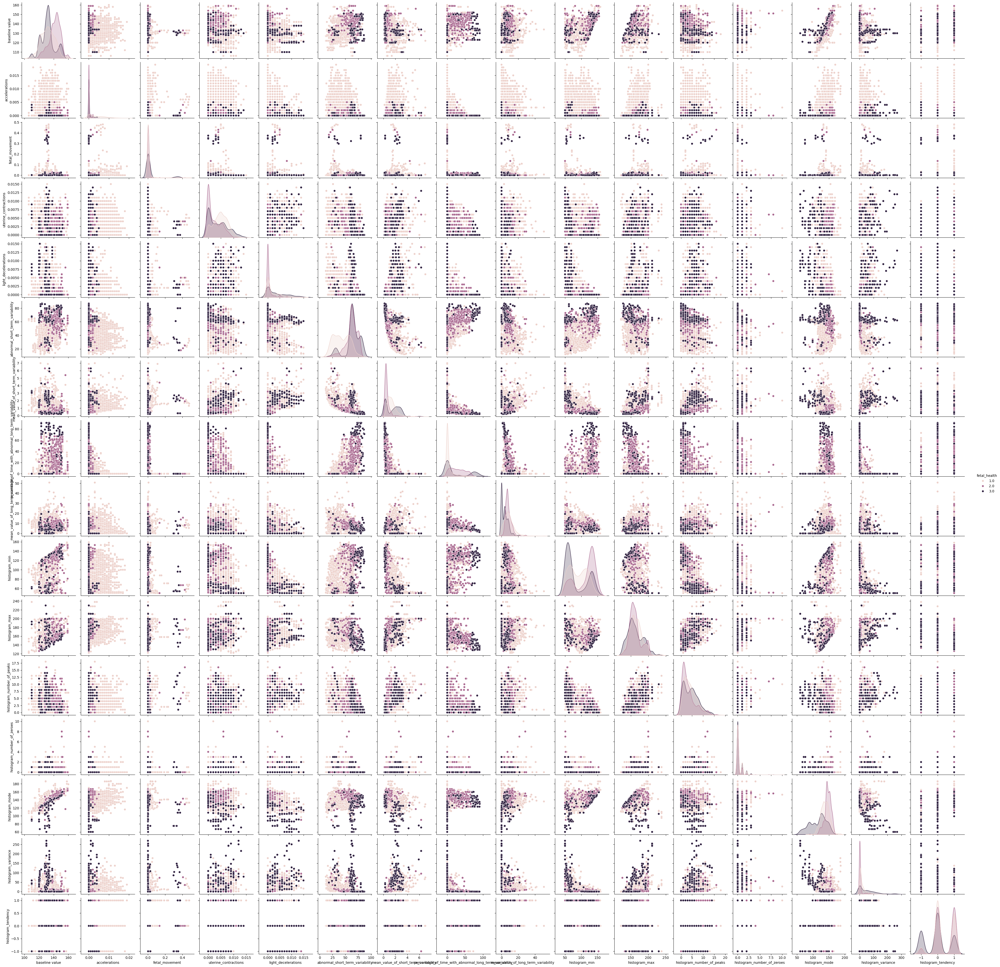

In [20]:
sb.pairplot(data_mod_re, hue = 'fetal_health')
plt.show()

In [21]:
#Separar X de Y

X = data_mod_re.drop(columns = 'fetal_health')
y = data_mod_re[['fetal_health']]
print(f'Tamaño de X: {X.shape}')
print(f'Tamaño de Y: {y.shape}')

Tamaño de X: (4965, 16)
Tamaño de Y: (4965, 1)


In [22]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.pipeline import Pipeline

In [ ]:
#Transformador de columnas
from sklearn.preprocessing import OrdinalEncoder


num_cols = X.select_dtypes(include = ['int64', 'float64']).columns.to_list()
cat_cols = X.select_dtypes(include = ['object']).columns.to_list()
 
ord_features = ['histogram_tendency']
num_features = [c for c in num_cols if c not in ord_features]
cat_features = [c for c in cat_cols]
num_transformer = Pipeline(steps = [('scaler', MinMaxScaler())])
#cat_transformer = Pipeline(steps = [('onehot', OneHotEncoder(handle_unknown = 'ignore'))])
ord_pipe = Pipeline(steps=[('encoder', OrdinalEncoder(categories=[[-1, 0, 1]]))])
cat_transformer = Pipeline(steps = [('encoder', OneHotEncoder(handle_unknown = 'ignore'))])
preprocessor = ColumnTransformer(transformers = [('num', num_transformer, num_features),
                                                 ('ord', ord_pipe, ord_features),], remainder = 'passthrough')
preprocessor


ColumnTransformer(remainder='passthrough',
                  transformers=[('num',
                                 Pipeline(steps=[('scaler', MinMaxScaler())]),
                                 ['baseline value', 'accelerations',
                                  'fetal_movement', 'uterine_contractions',
                                  'light_decelerations',
                                  'abnormal_short_term_variability',
                                  'mean_value_of_short_term_variability',
                                  'percentage_of_time_with_abnormal_long_term_variability',
                                  'mean_value_of_long_term_variability',
                                  'histogram_min', 'histogram_max',
                                  'histogram_number_of_peaks',
                                  'histogram_number_of_zeroes',
                                  'histogram_mode', 'histogram_variance',
                                  'histogram_tendency']),
                                ('cat',
                                 Pipeline(steps=[('encoder', OneHotEncoder())]),
                                 [])])

In [24]:
X_pre = preprocessor.fit_transform(X)
#cod_cat = preprocessor.named_transformers_['cat']['encoder'].get_feature_names_out(cat_cols)
X_pro = pd.DataFrame(X_pre, columns = np.concatenate([num_cols]))
X_pro.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,mean_value_of_long_term_variability,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_variance,histogram_tendency
0,0.481481,0.315789,0.000000,0.400000,0.2,0.066667,0.279412,0.0,0.205128,0.165138,0.655172,0.333333,0.1,0.637795,0.044610,0.5
1,0.500000,0.157895,0.000000,0.533333,0.2,0.053333,0.279412,0.0,0.264300,0.165138,0.655172,0.277778,0.1,0.637795,0.048327,0.5
2,0.518519,0.157895,0.000000,0.533333,0.2,0.053333,0.323529,0.0,0.453649,0.027523,0.413793,0.611111,0.0,0.606299,0.048327,1.0
3,0.481481,0.368421,0.000000,0.533333,0.0,0.053333,0.323529,0.0,0.392505,0.027523,0.413793,0.500000,0.0,0.606299,0.040892,1.0
4,0.462963,0.263158,0.149688,0.533333,0.2,0.213333,0.176471,0.0,0.254438,0.348624,0.275862,0.277778,0.0,0.590551,0.026022,1.0


In [25]:
#Construir los conjuntos de entrenamiento y validación
np.random.seed(20)
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_pro, y, test_size = 0.1, random_state = 20)
print(f'Tamaño de X_train: {X_train.shape, y_train.shape}') 
print(f'Tamaño de X_val: {X_val.shape, y_val.shape}')   

Tamaño de X_train: ((4468, 16), (4468, 1))
Tamaño de X_val: ((497, 16), (497, 1))


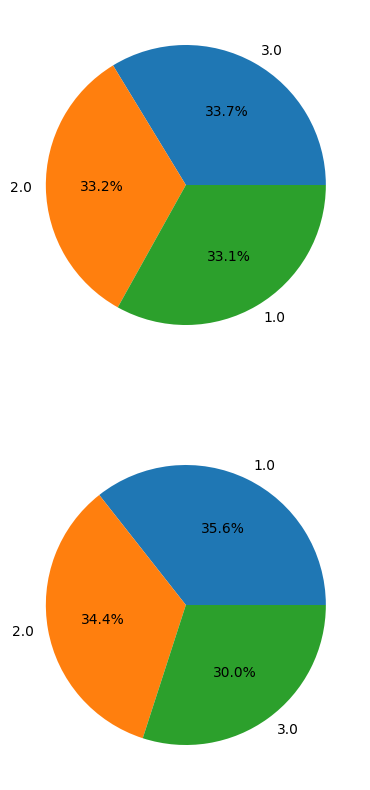

In [26]:
fig, ax = plt.subplots(2,1, figsize = (10, 10))
ax = ax.flat
ax[0].pie(y_train.fetal_health.value_counts(), labels = y_train.fetal_health.value_counts().index, autopct = '%1.1f%%')
ax[1].pie(y_val.fetal_health.value_counts(), labels = y_val.fetal_health.value_counts().index, autopct = '%1.1f%%')
plt.show()

# 7.Modelado de datos - Data modeling

- RegLog
- KNN
- SVM
- Decision tree
- Random forest
- Extra tree clasifier
- Adaptative boosting
- Gradient boosting
- Perceptron multicapa (RNA)

In [27]:
#Regresión logística
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, StratifiedKFold
np.random.seed(20)
modelo_1= LogisticRegression(solver='saga', random_state=123)
param_grid = {'penalty':['l1','l2','elasticent'],'C':[0.001,0.01,0.1,1,10,100,1000]}
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
clf_1 = GridSearchCV(estimator= modelo_1, param_grid=param_grid, cv = cv, scoring= 'f1_weighted')
clf_1.fit(X_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=123, shuffle=True),
             estimator=LogisticRegression(random_state=123, solver='saga'),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
                         'penalty': ['l1', 'l2', 'elasticent']},
             scoring='f1_weighted')

In [28]:
validation =  pd.concat([pd.DataFrame(clf_1.cv_results_['params']),
                         pd.DataFrame(clf_1.cv_results_['mean_test_score'], columns = ['f1_score'])], axis = 1)
validation.sort_values(by = 'f1_score', ascending = False)

,C,penalty,f1_score
16,100.000,l2,0.862773
12,10.000,l1,0.862773
13,10.000,l2,0.861769
15,100.000,l1,0.860611
19,1000.000,l2,0.860611
18,1000.000,l1,0.860146
9,1.000,l1,0.859956
10,1.000,l2,0.845792
6,0.100,l1,0.840430
7,0.100,l2,0.824706


In [29]:
#KNN
from sklearn.neighbors import KNeighborsClassifier
np.random.seed(20)
modelo_2= KNeighborsClassifier()
param_grid = {'n_neighbors':[3,5,7,9,11,13,15,49,101,379],'p':[1,2]}
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
clf_2 = GridSearchCV(estimator= modelo_2, param_grid=param_grid, cv = cv, scoring= 'f1_weighted')
clf_2.fit(X_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=123, shuffle=True),
             estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [3, 5, 7, 9, 11, 13, 15, 49, 101, 379],
                         'p': [1, 2]},
             scoring='f1_weighted')

In [30]:
validation =  pd.concat([pd.DataFrame(clf_2.cv_results_['params']),
                         pd.DataFrame(clf_2.cv_results_['mean_test_score'], columns = ['f1_score'])], axis = 1)
validation.sort_values(by = 'f1_score', ascending = False)

,n_neighbors,p,f1_score
0,3,1,0.969417
1,3,2,0.968995
2,5,1,0.953161
3,5,2,0.951375
4,7,1,0.944566
5,7,2,0.934239
6,9,1,0.929548
7,9,2,0.923050
9,11,2,0.915537
8,11,1,0.915397


In [31]:
#SVC
from sklearn.svm import SVC
np.random.seed(20)
modelo_3= SVC(random_state=123)
param_grid = {'C':[0.001,0.1,1,10,100],'kernel':['linear','rbf','poly','sigmoid'],'degree':[2,3]} #tolerancia error
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
clf_3 = GridSearchCV(estimator= modelo_3, param_grid=param_grid, cv = cv, scoring= 'f1_weighted', n_jobs = -1)
clf_3.fit(X_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=123, shuffle=True),
             estimator=SVC(random_state=123), n_jobs=-1,
             param_grid={'C': [0.001, 0.1, 1, 10, 100], 'degree': [2, 3],
                         'kernel': ['linear', 'rbf', 'poly', 'sigmoid']},
             scoring='f1_weighted')

In [32]:
validation =  pd.concat([pd.DataFrame(clf_3.cv_results_['params']),
                         pd.DataFrame(clf_3.cv_results_['mean_test_score'], columns = ['f1_score'])], axis = 1)
validation.sort_values(by = 'f1_score', ascending = False)

,C,degree,kernel,f1_score
37,100.000,3,rbf,0.972078
33,100.000,2,rbf,0.972078
38,100.000,3,poly,0.965128
25,10.000,2,rbf,0.950442
29,10.000,3,rbf,0.950442
30,10.000,3,poly,0.949780
34,100.000,2,poly,0.946622
26,10.000,2,poly,0.932126
22,1.000,3,poly,0.929614
17,1.000,2,rbf,0.911223


In [33]:
#Decision tree
from sklearn.tree import DecisionTreeClassifier, plot_tree
np.random.seed(20)
modelo_tree = DecisionTreeClassifier(random_state = 123, max_depth= None)
modelo_tree.fit(X_train, y_train)
print(f'Profundidad del árbol: {modelo_tree.get_depth()}')
print(f'Cantidad de hojas: {modelo_tree.get_n_leaves()}')


Profundidad del árbol: 21
Cantidad de hojas: 161


In [34]:
modelo_4= DecisionTreeClassifier(random_state=123)
param_grid = {'criterion':['gini','entropy','log_loss'],'max_depth':[5,7,9,12,15,18],'max_leaf_nodes':[10,20,30,40,50,None],'min_samples_split':[2,3,4,5]}
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
clf_4 = GridSearchCV(estimator= modelo_4, param_grid=param_grid, cv = cv, scoring= 'f1_weighted', n_jobs = -1)
clf_4.fit(X_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=123, shuffle=True),
             estimator=DecisionTreeClassifier(random_state=123), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [5, 7, 9, 12, 15, 18],
                         'max_leaf_nodes': [10, 20, 30, 40, 50, None],
                         'min_samples_split': [2, 3, 4, 5]},
             scoring='f1_weighted')

In [35]:
validation =  pd.concat([pd.DataFrame(clf_4.cv_results_['params']),
                         pd.DataFrame(clf_4.cv_results_['mean_test_score'], columns = ['f1_score'])], axis = 1)
validation.sort_values(by = 'f1_score', ascending = False)

,criterion,max_depth,max_leaf_nodes,min_samples_split,f1_score
117,gini,15,NaN,3,0.979539
140,gini,18,NaN,2,0.979533
141,gini,18,NaN,3,0.979320
116,gini,15,NaN,2,0.978639
428,log_loss,18,NaN,2,0.978411
...,...,...,...,...,...
51,gini,9,10.0,5,0.871949
72,gini,12,10.0,2,0.871949
73,gini,12,10.0,3,0.871949
74,gini,12,10.0,4,0.871949


In [36]:
#Extra tree classifier
from sklearn.ensemble import ExtraTreesClassifier
np.random.seed(20)
modelo_5 = ExtraTreesClassifier(random_state=123)
param_grid = {'criterion':['gini','entropy','log_loss'],'max_depth':[5,7,9,12],'max_leaf_nodes':[10,40,None],'min_samples_split':[2,3],'n_estimators':[100,200,300]}
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
clf_5 = GridSearchCV(estimator= modelo_5, param_grid=param_grid, cv = cv, scoring= 'f1_weighted',n_jobs=-1)
clf_5.fit(X_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=123, shuffle=True),
             estimator=ExtraTreesClassifier(random_state=123), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [5, 7, 9, 12],
                         'max_leaf_nodes': [10, 40, None],
                         'min_samples_split': [2, 3],
                         'n_estimators': [100, 200, 300]},
             scoring='f1_weighted')

In [37]:
validation =  pd.concat([pd.DataFrame(clf_5.cv_results_['params']),
                         pd.DataFrame(clf_5.cv_results_['mean_test_score'], columns = ['f1_score'])], axis = 1)
validation.sort_values(by = 'f1_score', ascending = False)

,criterion,max_depth,max_leaf_nodes,min_samples_split,n_estimators,f1_score
210,log_loss,12,NaN,2,100,0.983638
138,entropy,12,NaN,2,100,0.983638
140,entropy,12,NaN,2,300,0.982740
212,log_loss,12,NaN,2,300,0.982740
213,log_loss,12,NaN,3,100,0.982517
...,...,...,...,...,...,...
108,entropy,9,10.0,2,100,0.844512
183,log_loss,9,10.0,3,100,0.844512
180,log_loss,9,10.0,2,100,0.844512
198,log_loss,12,10.0,2,100,0.844512


In [38]:
#Random forest classifier
from sklearn.ensemble import RandomForestClassifier
np.random.seed(20)
modelo_6 = RandomForestClassifier(random_state=123)
param_grid = {'criterion':['gini','entropy','log_loss'],'max_depth':[5,7,9,12],'max_leaf_nodes':[10,40,None],'min_samples_split':[2,3],'n_estimators':[100,200,300]}
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
clf_6 = GridSearchCV(estimator= modelo_6, param_grid=param_grid, cv = cv, scoring= 'f1_weighted',n_jobs=-1)
clf_6.fit(X_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=123, shuffle=True),
             estimator=RandomForestClassifier(random_state=123), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [5, 7, 9, 12],
                         'max_leaf_nodes': [10, 40, None],
                         'min_samples_split': [2, 3],
                         'n_estimators': [100, 200, 300]},
             scoring='f1_weighted')

In [39]:
validation =  pd.concat([pd.DataFrame(clf_6.cv_results_['params']),
                         pd.DataFrame(clf_6.cv_results_['mean_test_score'], columns = ['f1_score'])], axis = 1)
validation.sort_values(by = 'f1_score', ascending = False)

,criterion,max_depth,max_leaf_nodes,min_samples_split,n_estimators,f1_score
215,log_loss,12,NaN,3,300,0.986319
143,entropy,12,NaN,3,300,0.986319
140,entropy,12,NaN,2,300,0.986094
212,log_loss,12,NaN,2,300,0.986094
214,log_loss,12,NaN,3,200,0.986091
...,...,...,...,...,...,...
76,entropy,5,10.0,3,200,0.897477
148,log_loss,5,10.0,3,200,0.897477
145,log_loss,5,10.0,2,200,0.897477
5,gini,5,10.0,3,300,0.892552


In [40]:
#Adaptative boosting
from sklearn.ensemble import AdaBoostClassifier
np.random.seed(20)
modelo_7 = AdaBoostClassifier(random_state=123)
param_grid = {'n_estimators':[100,200,300],'learning_rate':[0.01,0.1,1,10,100]}
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
clf_7 = GridSearchCV(estimator= modelo_7, param_grid=param_grid, cv = cv, scoring= 'f1_weighted',n_jobs=-1)
clf_7.fit(X_train,y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=123, shuffle=True),
             estimator=AdaBoostClassifier(random_state=123), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 1, 10, 100],
                         'n_estimators': [100, 200, 300]},
             scoring='f1_weighted')

In [41]:
validation =  pd.concat([pd.DataFrame(clf_7.cv_results_['params']),
                         pd.DataFrame(clf_7.cv_results_['mean_test_score'], columns = ['f1_score'])], axis = 1)
validation.sort_values(by = 'f1_score', ascending = False)

,learning_rate,n_estimators,f1_score
7,1.00,200,0.911760
6,1.00,100,0.910923
8,1.00,300,0.909538
5,0.10,300,0.862195
4,0.10,200,0.850914
3,0.10,100,0.825855
2,0.01,300,0.759810
1,0.01,200,0.742261
0,0.01,100,0.706382
10,10.00,200,0.408326


In [42]:
#Gradient boosting
from sklearn.ensemble import  GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV
np.random.seed(20)
modelo_8 = GradientBoostingClassifier(random_state=123)
param_grid = {'n_estimators':[100,200,300],'criterion':['friedman_mse', 'squared_error']
              ,'max_depth':[5,7,9,12],'max_leaf_nodes':[10,40,None],'min_samples_split':[2,3],'loss':['log_loss','exponential']}
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
clf_8 = RandomizedSearchCV(estimator= modelo_8, param_distributions=param_grid, cv = cv, scoring= 'f1_weighted',n_iter=76,n_jobs=-1)
clf_8.fit(X_train,y_train)

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=123, shuffle=True),
                   estimator=GradientBoostingClassifier(random_state=123),
                   n_iter=76, n_jobs=-1,
                   param_distributions={'criterion': ['friedman_mse',
                                                      'squared_error'],
                                        'loss': ['log_loss', 'exponential'],
                                        'max_depth': [5, 7, 9, 12],
                                        'max_leaf_nodes': [10, 40, None],
                                        'min_samples_split': [2, 3],
                                        'n_estimators': [100, 200, 300]},
                   scoring='f1_weighted')

In [43]:
validation =  pd.concat([pd.DataFrame(clf_8.cv_results_['params']),
                         pd.DataFrame(clf_8.cv_results_['mean_test_score'], columns = ['f1_score'])], axis = 1)
validation.sort_values(by = 'f1_score', ascending = False)

,n_estimators,min_samples_split,max_leaf_nodes,max_depth,loss,criterion,f1_score
65,300,3,40.0,12,log_loss,squared_error,0.990355
27,300,2,40.0,12,log_loss,friedman_mse,0.990353
11,300,2,NaN,7,log_loss,friedman_mse,0.990136
7,200,2,40.0,12,log_loss,friedman_mse,0.990129
50,300,3,NaN,7,log_loss,squared_error,0.989914
...,...,...,...,...,...,...,...
61,200,2,NaN,7,exponential,friedman_mse,NaN
66,100,2,10.0,5,exponential,squared_error,NaN
69,100,2,NaN,5,exponential,friedman_mse,NaN
72,200,3,10.0,12,exponential,squared_error,NaN


In [44]:
#Red Neuronal Artificial
from sklearn.neural_network import MLPClassifier
modelo_9 = MLPClassifier(random_state = 123)
np.random.seed(20)
param_grid = {'hidden_layer_sizes':[(10,), (20,), (30,), (30, 20), (20, 10), (30, 20, 10)],
              'activation':['relu', 'logistic', 'tanh'], 'solver':['lbfgs', 'sgd', 'adam'], 
              'learning_rate_init':[0.001, 0.1, 1, 10, 100], 'max_iter':[100, 200, 500]}
cv = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 123)
clf_9 = RandomizedSearchCV(estimator = modelo_9, param_distributions = param_grid, cv = cv, scoring = 'f1_weighted', n_iter = 160, n_jobs = -1)
clf_9.fit(X_train, y_train)

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=123, shuffle=True),
                   estimator=MLPClassifier(random_state=123), n_iter=160,
                   n_jobs=-1,
                   param_distributions={'activation': ['relu', 'logistic',
                                                       'tanh'],
                                        'hidden_layer_sizes': [(10,), (20,),
                                                               (30,), (30, 20),
                                                               (20, 10),
                                                               (30, 20, 10)],
                                        'learning_rate_init': [0.001, 0.1, 1,
                                                               10, 100],
                                        'max_iter': [100, 200, 500],
                                        'solver': ['lbfgs', 'sgd', 'adam']},
                   scoring='f1_weighted')

In [45]:
validation = pd.concat([pd.DataFrame(clf_9.cv_results_['params']),
                        pd.DataFrame(clf_9.cv_results_['mean_test_score'], columns = ['f1_score'])], axis = 1)
validation.sort_values('f1_score', ascending = False)

,solver,max_iter,learning_rate_init,hidden_layer_sizes,activation,f1_score
86,lbfgs,500,0.001,"(30, 20)",tanh,0.980965
0,lbfgs,500,10.000,"(30, 20, 10)",logistic,0.978903
143,lbfgs,500,1.000,"(20, 10)",tanh,0.978714
16,lbfgs,500,10.000,"(20, 10)",tanh,0.978714
141,lbfgs,500,0.001,"(20,)",tanh,0.978710
...,...,...,...,...,...,...
60,adam,500,100.000,"(10,)",tanh,0.164843
138,adam,500,100.000,"(20,)",relu,0.164843
21,sgd,500,10.000,"(20,)",tanh,0.164648
29,adam,500,10.000,"(20, 10)",tanh,0.164648


## Evaluacion de modelos - Model evaluation

In [46]:
#Definición de mejores estimadores
modelo_lr = clf_1.best_estimator_
modelo_knn = clf_2.best_estimator_
modelo_svc = clf_3.best_estimator_
modelo_dt = clf_4.best_estimator_
modelo_et = clf_5.best_estimator_
modelo_rf = clf_6.best_estimator_
modelo_ac = clf_7.best_estimator_
modelo_gb = clf_8.best_estimator_
modelo_rnn = clf_9.best_estimator_

In [47]:
#Predicciones de prueba
y_pred_lr = modelo_lr.predict(X_val)
y_pred_knn = modelo_knn.predict(X_val)
y_pred_svc = modelo_svc.predict(X_val)
y_pred_dt = modelo_dt.predict(X_val)
y_pred_et = modelo_et.predict(X_val)
y_pred_rf = modelo_rf.predict(X_val)
y_pred_ac = modelo_ac.predict(X_val)
y_pred_gb = modelo_gb.predict(X_val)
y_pred_rnn = modelo_rnn.predict(X_val)

Las métricas de desempeño para Regresión Logística son: 
              precision    recall  f1-score   support

         1.0       0.95      0.83      0.89       177
         2.0       0.78      0.85      0.81       171
         3.0       0.83      0.87      0.85       149

    accuracy                           0.85       497
   macro avg       0.85      0.85      0.85       497
weighted avg       0.86      0.85      0.85       497



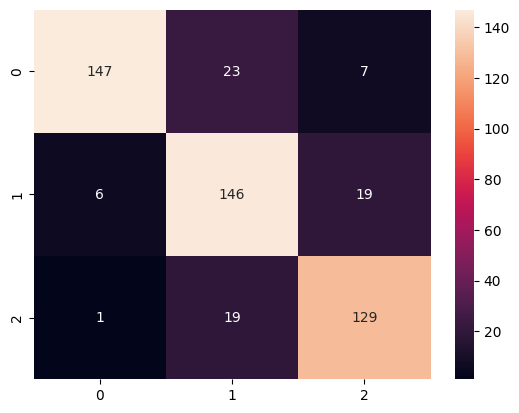

In [48]:
from sklearn.metrics import confusion_matrix, classification_report
print("Las métricas de desempeño para Regresión Logística son: ")
print(classification_report(y_val, y_pred_lr))
sb.heatmap(confusion_matrix(y_val, y_pred_lr), annot = True, fmt = 'd');

Las métricas de desempeño para K Vecinos Más Cercanos son: 
              precision    recall  f1-score   support

         1.0       0.99      0.91      0.95       177
         2.0       0.92      0.98      0.95       171
         3.0       0.99      1.00      0.99       149

    accuracy                           0.96       497
   macro avg       0.96      0.96      0.96       497
weighted avg       0.96      0.96      0.96       497



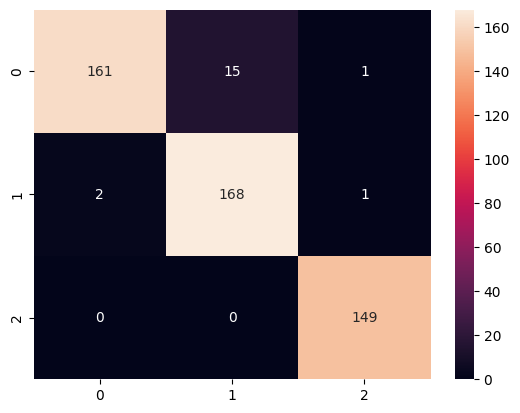

In [49]:
print("Las métricas de desempeño para K Vecinos Más Cercanos son: ")
print(classification_report(y_val, y_pred_knn))
sb.heatmap(confusion_matrix(y_val, y_pred_knn), annot = True, fmt = 'd');

Las métricas de desempeño para Máquina de Soporte Vectorial son: 
              precision    recall  f1-score   support

         1.0       1.00      0.92      0.96       177
         2.0       0.90      0.99      0.95       171
         3.0       0.99      0.97      0.98       149

    accuracy                           0.96       497
   macro avg       0.97      0.96      0.96       497
weighted avg       0.97      0.96      0.96       497



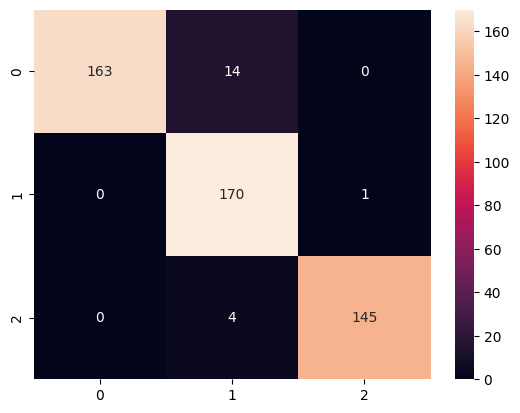

In [50]:
print("Las métricas de desempeño para Máquina de Soporte Vectorial son: ")
print(classification_report(y_val, y_pred_svc))
sb.heatmap(confusion_matrix(y_val, y_pred_svc), annot = True, fmt = 'd');

Las métricas de desempeño para Árbol de Decisión son: 
              precision    recall  f1-score   support

         1.0       1.00      0.93      0.96       177
         2.0       0.94      1.00      0.97       171
         3.0       0.99      1.00      0.99       149

    accuracy                           0.98       497
   macro avg       0.98      0.98      0.98       497
weighted avg       0.98      0.98      0.98       497



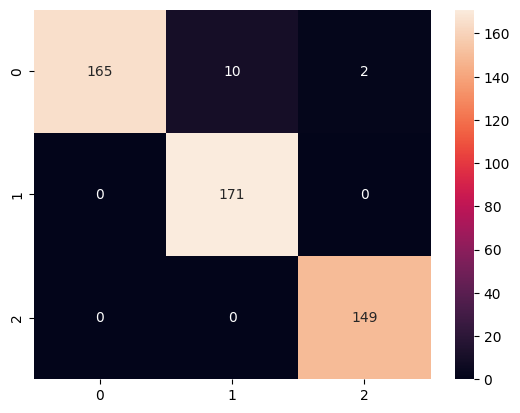

In [51]:
print("Las métricas de desempeño para Árbol de Decisión son: ")
print(classification_report(y_val, y_pred_dt))
sb.heatmap(confusion_matrix(y_val, y_pred_dt), annot = True, fmt = 'd');

Las métricas de desempeño para Extra Tree Classifier son: 
              precision    recall  f1-score   support

         1.0       1.00      0.94      0.97       177
         2.0       0.94      1.00      0.97       171
         3.0       1.00      1.00      1.00       149

    accuracy                           0.98       497
   macro avg       0.98      0.98      0.98       497
weighted avg       0.98      0.98      0.98       497



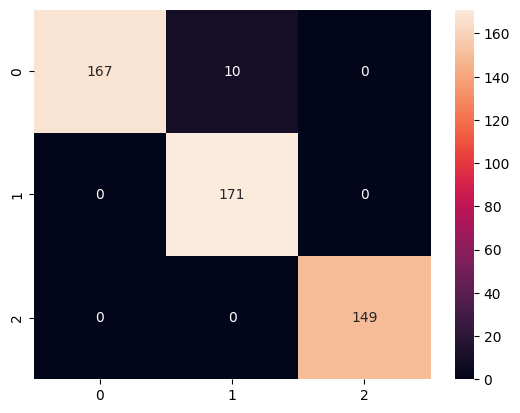

In [52]:
print("Las métricas de desempeño para Extra Tree Classifier son: ")
print(classification_report(y_val, y_pred_et))
sb.heatmap(confusion_matrix(y_val, y_pred_et), annot = True, fmt = 'd');

Las métricas de desempeño para Bosque Aleatorio son: 
              precision    recall  f1-score   support

         1.0       1.00      0.97      0.99       177
         2.0       0.97      1.00      0.99       171
         3.0       1.00      1.00      1.00       149

    accuracy                           0.99       497
   macro avg       0.99      0.99      0.99       497
weighted avg       0.99      0.99      0.99       497



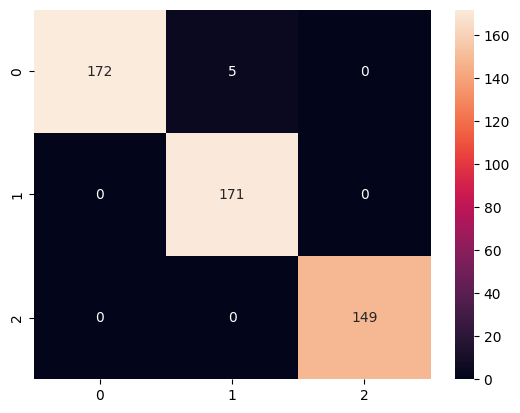

In [53]:
print("Las métricas de desempeño para Bosque Aleatorio son: ")
print(classification_report(y_val, y_pred_rf))
sb.heatmap(confusion_matrix(y_val, y_pred_rf), annot = True, fmt = 'd');

Las métricas de desempeño para Adaptative Boosting son: 
              precision    recall  f1-score   support

         1.0       0.88      0.88      0.88       177
         2.0       0.86      0.88      0.87       171
         3.0       0.99      0.95      0.97       149

    accuracy                           0.90       497
   macro avg       0.91      0.91      0.91       497
weighted avg       0.90      0.90      0.90       497



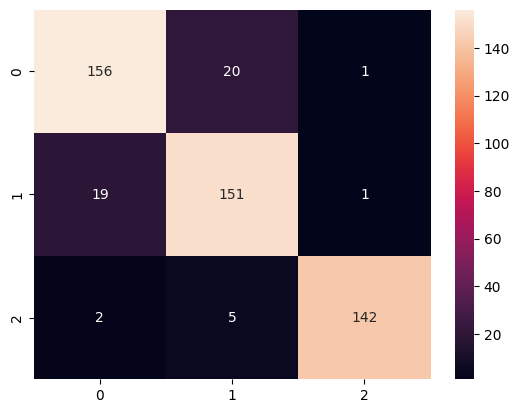

In [54]:
print("Las métricas de desempeño para Adaptative Boosting son: ")
print(classification_report(y_val, y_pred_ac))
sb.heatmap(confusion_matrix(y_val, y_pred_ac), annot = True, fmt = 'd');

Las métricas de desempeño para Gradient Boosting son: 
              precision    recall  f1-score   support

         1.0       1.00      0.98      0.99       177
         2.0       0.98      1.00      0.99       171
         3.0       1.00      1.00      1.00       149

    accuracy                           0.99       497
   macro avg       0.99      0.99      0.99       497
weighted avg       0.99      0.99      0.99       497



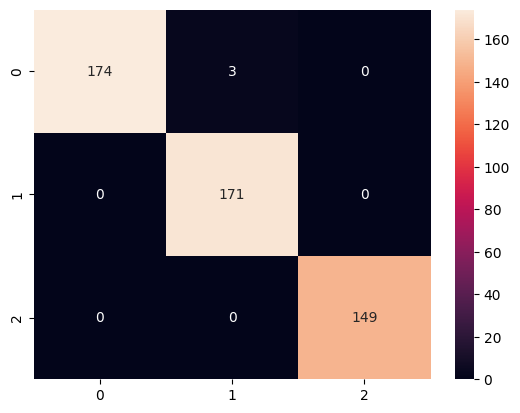

In [55]:
print("Las métricas de desempeño para Gradient Boosting son: ")
print(classification_report(y_val, y_pred_gb))
sb.heatmap(confusion_matrix(y_val, y_pred_gb), annot = True, fmt = 'd');

Las métricas de desempeño para Red Neuronal Artificial son: 
              precision    recall  f1-score   support

         1.0       1.00      0.97      0.98       177
         2.0       0.96      1.00      0.98       171
         3.0       0.99      0.98      0.98       149

    accuracy                           0.98       497
   macro avg       0.98      0.98      0.98       497
weighted avg       0.98      0.98      0.98       497



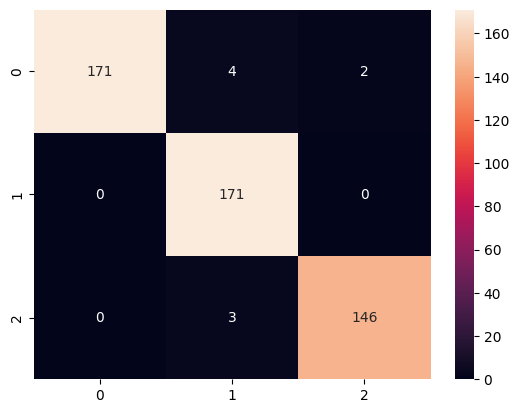

In [56]:
print("Las métricas de desempeño para Red Neuronal Artificial son: ")
print(classification_report(y_val, y_pred_rnn))
sb.heatmap(confusion_matrix(y_val, y_pred_rnn), annot = True, fmt = 'd');

## Despliegue - Deployment

In [58]:
data = pd.read_csv('datos_caso2.csv')
target = 'fetal_health'
X = data.drop(columns = target)
y = data[[target]]

In [59]:
#Identificar las variables a ignorar
all_num = X.select_dtypes(include = ['int64', 'float64']).columns.to_list()
all_cat = X.select_dtypes(include = ['object']).columns.to_list()
ignored = ['histogram_median', 'histogram_mean','histogram_width','prolongued_decelerations','severe_decelerations']
num_features = [c for c in all_num if c not in ignored]
cat_features = [c for c in all_cat if c not in ignored]

In [60]:
from sklearn.impute import SimpleImputer
num_pipe = Pipeline(steps = [('num_imputer', SimpleImputer(strategy = 'median')), ('scaler', MinMaxScaler())])
cat_pipe = Pipeline(steps = [('cat_imputer', SimpleImputer(strategy = 'most_frequent')), ('encoder', OneHotEncoder())])

In [61]:
modelo_gb

GradientBoostingClassifier(criterion='squared_error', max_depth=12,
                           max_leaf_nodes=40, min_samples_split=3,
                           n_estimators=300, random_state=123)

In [62]:
preprocessor = ColumnTransformer(transformers = [('num', num_pipe, num_features), ('cat', cat_pipe, cat_features)], remainder = 'drop')
pipe_model = Pipeline(steps = [('preprocess', preprocessor), ('model', modelo_gb)])
pipe_model

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('num_imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   MinMaxScaler())]),
                                                  ['baseline value',
                                                   'accelerations',
                                                   'fetal_movement',
                                                   'uterine_contractions',
                                                   'light_decelerations',
                                                   'abnormal_short_term_variability',
                                                   'mean_value_of_short_term_variability',
                                                   'percentage_of_time_...
                                                   'histogram_number_of_zeroes',
                                                   'histogram_mode',
                                                   'histogram_variance',
                                                   'histogram_tendency']),
                                                 ('cat',
                                                  Pipeline(steps=[('cat_imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder())]),
                                                  [])])),
                ('model',
                 GradientBoostingClassifier(criterion='squared_error',
                                            max_depth=12, max_leaf_nodes=40,
                                            min_samples_split=3,
                                            n_estimators=300,
                                            random_state=123))])

In [63]:
pipe_model.fit(X, y)

Pipeline(steps=[('preprocess',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('num_imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   MinMaxScaler())]),
                                                  ['baseline value',
                                                   'accelerations',
                                                   'fetal_movement',
                                                   'uterine_contractions',
                                                   'light_decelerations',
                                                   'abnormal_short_term_variability',
                                                   'mean_value_of_short_term_variability',
                                                   'percentage_of_time_...
                                                   'histogram_number_of_zeroes',
                                                   'histogram_mode',
                                                   'histogram_variance',
                                                   'histogram_tendency']),
                                                 ('cat',
                                                  Pipeline(steps=[('cat_imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OneHotEncoder())]),
                                                  [])])),
                ('model',
                 GradientBoostingClassifier(criterion='squared_error',
                                            max_depth=12, max_leaf_nodes=40,
                                            min_samples_split=3,
                                            n_estimators=300,
                                            random_state=123))])

In [64]:
pipe_model.predict(X)

array([2., 1., 1., ..., 2., 2., 1.], shape=(2126,))

In [65]:
print(classification_report(pipe_model.predict(X), y))

              precision    recall  f1-score   support

         1.0       1.00      1.00      1.00      1657
         2.0       0.99      1.00      1.00       293
         3.0       1.00      1.00      1.00       176

    accuracy                           1.00      2126
   macro avg       1.00      1.00      1.00      2126
weighted avg       1.00      1.00      1.00      2126



In [66]:
new_individual = [[
    120.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,
    73.0, 0.5, 43.0, 2.4, 64.0, 62.0, 126.0,
    2.0, 0.0, 120.0, 137.0, 121.0, 73.0, 1.0
]]

new_data = pd.DataFrame(data=new_individual, columns=X.columns)
new_data

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency
0,120.0,0.0,0.0,0.0,0.0,0.0,0.0,73.0,0.5,43.0,...,64.0,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0


In [67]:
pipe_model.predict(new_data)

array([2.])